<center><img src="https://img.pravda.com/images/doc/1/c/1cb93ce-36bfa52-vaccine690.jpg" width=700></img></center> 

# <center><b>Hello guys!

### <center>In this notebook you will see the process of dealing with missing data and filling it with appropriate <br><br><br>values.

### <center>You can also find exploratory data analysis along with vizualization on histograms and geo plots here.

### <center>Moreover, at the end of the notebook you can find predictive ARIMA model parameters choosing and making<br><br><br>predictions of the amount of vaccinated people!

### <center>I hope, this notebook would be interesting and useful for you!

# <b><br><center>Prepairing data

Importing all needed libraries.<br><br>

In [1]:
import numpy as np, pandas as pd
from IPython.display import Image
import matplotlib.pyplot as plt, seaborn as sns
import scipy
import warnings
import plotly.express as px
from itertools import product
import statsmodels.api as sm
import datetime
from tqdm import tqdm
warnings.filterwarnings('ignore')

<br>Loading data.<br><br>

In [2]:
data = pd.read_csv('country_vaccinations.csv')

<br>Check if everything loaded fine.<br><br>

In [3]:
data

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Argentina,ARG,2020-12-29,700.0,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
1,Argentina,ARG,2020-12-30,NaN,NaN,NaN,NaN,15656.0,NaN,NaN,NaN,346.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
2,Argentina,ARG,2020-12-31,32013.0,NaN,NaN,NaN,15656.0,0.07,NaN,NaN,346.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
3,Argentina,ARG,2021-01-01,NaN,NaN,NaN,NaN,11070.0,NaN,NaN,NaN,245.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
4,Argentina,ARG,2021-01-02,NaN,NaN,NaN,NaN,8776.0,NaN,NaN,NaN,194.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1648,Wales,NaN,2021-01-22,241016.0,240547.0,469.0,28284.0,15148.0,7.64,7.63,0.01,4804.0,"Oxford/AstraZeneca, Pfizer/BioNTech",Government of the United Kingdom,https://coronavirus.data.gov.uk/details/health...
1649,Wales,NaN,2021-01-23,265054.0,264538.0,516.0,24038.0,17371.0,8.41,8.39,0.02,5510.0,"Oxford/AstraZeneca, Pfizer/BioNTech",Government of the United Kingdom,https://coronavirus.data.gov.uk/details/health...
1650,Wales,NaN,2021-01-24,271376.0,270833.0,543.0,6322.0,17063.0,8.61,8.59,0.02,5412.0,"Oxford/AstraZeneca, Pfizer/BioNTech",Government of the United Kingdom,https://coronavirus.data.gov.uk/details/health...
1651,Wales,NaN,2021-01-25,290147.0,289566.0,581.0,18771.0,18279.0,9.20,9.18,0.02,5798.0,"Oxford/AstraZeneca, Pfizer/BioNTech",Government of the United Kingdom,https://coronavirus.data.gov.uk/details/health...


In [4]:
data.shape

(1653, 15)

# <br><center><b>Missing data<br><br>

Now, let's check out if we have any missing data in our dataset.<br><br>

In [5]:
data.isna().sum()

country                                   0
iso_code                                182
date                                      0
total_vaccinations                      583
people_vaccinated                       812
people_fully_vaccinated                1287
daily_vaccinations_raw                  797
daily_vaccinations                       63
total_vaccinations_per_hundred          583
people_vaccinated_per_hundred           812
people_fully_vaccinated_per_hundred    1287
daily_vaccinations_per_million           63
vaccines                                  0
source_name                               0
source_website                            0
dtype: int64

<br>As can be seen, there is quite much missing data.<br><br>

Let's drop total_vaccinations missing data, as without this value any raw doesn't make much sense.<br><br>

In [6]:
data = data.drop(data[data.total_vaccinations.isna()].index)

In [7]:
data.isna().sum()

country                                  0
iso_code                                82
date                                     0
total_vaccinations                       0
people_vaccinated                      234
people_fully_vaccinated                706
daily_vaccinations_raw                 214
daily_vaccinations                      62
total_vaccinations_per_hundred           0
people_vaccinated_per_hundred          234
people_fully_vaccinated_per_hundred    706
daily_vaccinations_per_million          62
vaccines                                 0
source_name                              0
source_website                           0
dtype: int64

## <br>	<b>&bull;</b> people_vaccinated<br>

In [8]:
check_data = data.drop(data[data.people_vaccinated.isna()].index)

In [9]:
check_data.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
22,Argentina,ARG,2021-01-20,247933.0,243539.0,4394.0,NaN,11586.0,0.55,0.54,0.01,256.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
23,Argentina,ARG,2021-01-21,265724.0,249372.0,16352.0,17791.0,11704.0,0.59,0.55,0.04,259.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
24,Argentina,ARG,2021-01-22,279602.0,254456.0,25146.0,13878.0,11263.0,0.62,0.56,0.06,249.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
25,Argentina,ARG,2021-01-23,288064.0,258876.0,29188.0,8462.0,11124.0,0.64,0.57,0.06,246.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...
26,Argentina,ARG,2021-01-24,292023.0,260036.0,31987.0,3959.0,10342.0,0.65,0.58,0.07,229.0,Sputnik V,Ministry of Health,http://datos.salud.gob.ar/dataset/vacunas-cont...


<br>As can bee seen from our data, the values of total_vaccinations column are mostly the same as people_vaccenated column's.<br><br>

total_vaccinations_per_hundred's and people_vaccinated_per_hundred are also very similar.<br><br>

Let's check the correlation to understand if it is so.<br><br>

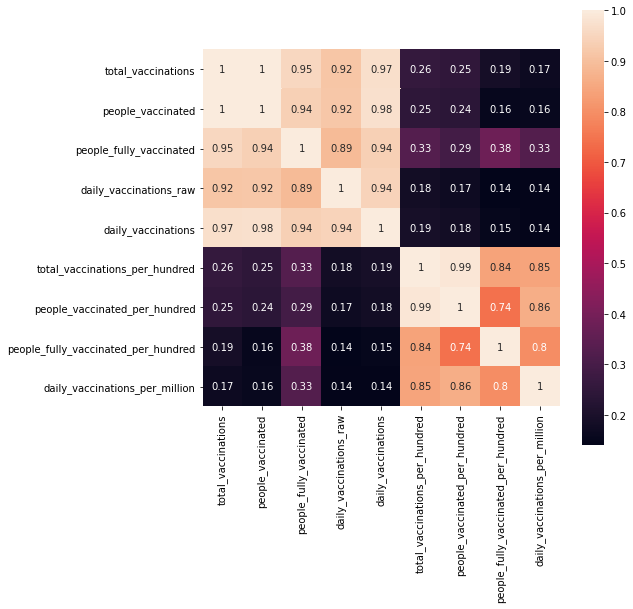

In [10]:
plt.subplots(figsize=(8, 8))
sns.heatmap(check_data.corr(), annot=True, square=True)
plt.show()

<br>As can bee seen from the heatmap, these features have almost ideal correlation.

## <br>	<b>&bull; </b>people_vaccinated and people_vaccinated_per_hundred<br>

people_vaccinated and people_vaccinated_per_hundred greatly correlates with total_vaccinations and total_vaccinations_per_hundred.<br><br>

##### <b> Let's check the hypothesis that these columns distributions are the same. </b><br><br>

##### <b> Now and then we will use Mann-Whithey U test for this goal. </b><br><br>

In [11]:
scipy.stats.mannwhitneyu(check_data.total_vaccinations, check_data.people_vaccinated)

MannwhitneyuResult(statistic=346105.5, pvalue=0.367468299898986)

<br><br>

In [12]:
scipy.stats.mannwhitneyu(check_data.total_vaccinations_per_hundred, check_data.people_vaccinated_per_hundred)

MannwhitneyuResult(statistic=345526.5, pvalue=0.3455941594708981)

<br>p-value is much higher than 0.05, which means we can't reject our hyphotesis. <br><br>

So, we will fill the missing values with the difference of these column's mean values.<br><br>

In [13]:
diff = check_data.total_vaccinations.mean() - check_data.people_vaccinated.mean()
diff_per_hundred = check_data.total_vaccinations_per_hundred.mean() - check_data.people_vaccinated_per_hundred.mean()

data.people_vaccinated = data.people_vaccinated.fillna(data.total_vaccinations - diff)
data.people_vaccinated_per_hundred = data.people_vaccinated_per_hundred.fillna(data.total_vaccinations_per_hundred - diff_per_hundred)

<br>Let's check if everything ok.<br><br>

In [14]:
data.isna().sum()

country                                  0
iso_code                                82
date                                     0
total_vaccinations                       0
people_vaccinated                        0
people_fully_vaccinated                706
daily_vaccinations_raw                 214
daily_vaccinations                      62
total_vaccinations_per_hundred           0
people_vaccinated_per_hundred            0
people_fully_vaccinated_per_hundred    706
daily_vaccinations_per_million          62
vaccines                                 0
source_name                              0
source_website                           0
dtype: int64

<br>Everything went fine we can move on  <b>&#10003;

# <br>	<b>&bull; </b>daily_vaccinations and daily_vaccinations_per_million<br>

daily_vaccinations and daily_vaccinations_per_million greatly correlates with people_vaccinated and people_vaccinated_per_hundred.<br><br>

##### <b> Let's check the hypothesis that these columns distributions are the same. <br><br>

In [15]:
scipy.stats.mannwhitneyu(check_data.people_vaccinated, check_data.daily_vaccinations)

MannwhitneyuResult(statistic=192211.0, pvalue=1.99182666272216e-57)

<br>

In [16]:
scipy.stats.mannwhitneyu(check_data.people_vaccinated_per_hundred, check_data.daily_vaccinations_per_million)

MannwhitneyuResult(statistic=8720.5, pvalue=2.14575218194001e-261)

<br>p-values are much less than 0.05, which means we will reject our hypothesis.<br><br>

<br>So, let's just fill missing values with zeros.<br><br>

In [17]:
data.daily_vaccinations = data.daily_vaccinations.fillna(0)
data.daily_vaccinations_per_million = data.daily_vaccinations_per_million.fillna(0)

<br>Let's check if everything ok.<br><br>

In [18]:
data.isna().sum()

country                                  0
iso_code                                82
date                                     0
total_vaccinations                       0
people_vaccinated                        0
people_fully_vaccinated                706
daily_vaccinations_raw                 214
daily_vaccinations                       0
total_vaccinations_per_hundred           0
people_vaccinated_per_hundred            0
people_fully_vaccinated_per_hundred    706
daily_vaccinations_per_million           0
vaccines                                 0
source_name                              0
source_website                           0
dtype: int64

<br>Everything worked fine <b>&#10003;<b>

# <br>	<b>&bull; </b>people_fully_vaccinated and people_fully_vaccinated_per_hundred<br>

people_fully_vaccinated and people_fully_vaccinated_per_hundred greatly correlates with total_vaccinations and total_vaccinations_per_hundred.

##### <b> <br>Let's check the hypothesis that these columns distributions are the same. </b><br><br>

In [19]:
scipy.stats.mannwhitneyu(check_data.people_fully_vaccinated, check_data.total_vaccinations)

MannwhitneyuResult(statistic=218730.0, pvalue=2.4925660098319323e-40)

<br>

In [20]:
scipy.stats.mannwhitneyu(check_data.people_fully_vaccinated_per_hundred, check_data.total_vaccinations_per_hundred)

MannwhitneyuResult(statistic=230658.5, pvalue=1.1596690546560134e-33)

<br>p-values are much less than 0.05, which means we will reject our hypothesis.<br><br>

Let's fill missing values with 0.<br><br>

In [21]:
data.people_fully_vaccinated = data.people_fully_vaccinated.fillna(0)
data.people_fully_vaccinated_per_hundred = data.people_fully_vaccinated_per_hundred.fillna(0)

<br>Let's check if everything ok.<br><br>

In [22]:
data.isna().sum()

country                                  0
iso_code                                82
date                                     0
total_vaccinations                       0
people_vaccinated                        0
people_fully_vaccinated                  0
daily_vaccinations_raw                 214
daily_vaccinations                       0
total_vaccinations_per_hundred           0
people_vaccinated_per_hundred            0
people_fully_vaccinated_per_hundred      0
daily_vaccinations_per_million           0
vaccines                                 0
source_name                              0
source_website                           0
dtype: int64

<br>We can move on <b>&#10003;

## <br>	<b>&bull; </b>daily_vaccinations_raw<br>

daily_vaccinations_raw greatly correlates with daily_vaccinations.<br><br>

##### <b> Let's check the hypothesis that these columns distributions are the same. </b><br><br>

In [23]:
scipy.stats.mannwhitneyu(check_data.daily_vaccinations_raw, check_data.daily_vaccinations)

MannwhitneyuResult(statistic=302630.0, pvalue=1.0533640335695945e-06)

<br>p-values are much less than 0.05, which means we will reject our hypothesis.<br><br>

Let's fill missing values with 0.<br><br>

In [24]:
data.daily_vaccinations_raw = data.daily_vaccinations_raw.fillna(0)

<br>Let's check if everything worked fine.<br><br>

In [25]:
data.isna().sum()

country                                 0
iso_code                               82
date                                    0
total_vaccinations                      0
people_vaccinated                       0
people_fully_vaccinated                 0
daily_vaccinations_raw                  0
daily_vaccinations                      0
total_vaccinations_per_hundred          0
people_vaccinated_per_hundred           0
people_fully_vaccinated_per_hundred     0
daily_vaccinations_per_million          0
vaccines                                0
source_name                             0
source_website                          0
dtype: int64

<br>Everything worked fine <b>&#10003;

## <br>	<b>&bull; </b> iso_code

<br>Let's find out which countries have missing iso-code.<br><br>

In [26]:
data[data.iso_code.isna()].country.unique()

array(['England', 'Northern Cyprus', 'Northern Ireland', 'Scotland',
       'Wales'], dtype=object)

<br>Thats the iso-codes which are used for these countries : GB-ENG	for England, NC for Northern Cyprus, GB-NIR	for Northern Ireland, GB-SCT for Scotland, GB-WLS for Wales.<br><br>


We will fill missing iso-codes with appropriate ones.<br><br>

In [27]:
data[data.country == 'England'] = data[data.country == 'England'].fillna('GB-ENG')
data[data.country == 'Northern Ireland'] == data[data.country == 'Northern Ireland'].fillna('GB-NIR')
data[data.country == 'Scotland'] = data[data.country == 'Scotland'].fillna('GB-SCT')
data[data.country == 'Wales'] = data[data.country == 'Wales'].fillna('GB-WLS')
data = data.fillna('NC')

<br>Let's check if everything went fine.<br><br>

In [28]:
data.isna().sum()

country                                0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
daily_vaccinations_raw                 0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
daily_vaccinations_per_million         0
vaccines                               0
source_name                            0
source_website                         0
dtype: int64

<br>We have finally dealt with missing data, which was quite long 😀

# <center><br><b>EDA with vizualization

## <br>	<b>&bull;</b> Amount of vaccinated people<br>

First of all, let's vizualize which countries do have the highest ammount of vaccinated citizens.<br><br>

In [29]:
cols = ['country', 'total_vaccinations', 'iso_code', 'vaccines', 'total_vaccinations_per_hundred']
vacc_amount = data[cols].groupby('country').max().sort_values('total_vaccinations', ascending=False)

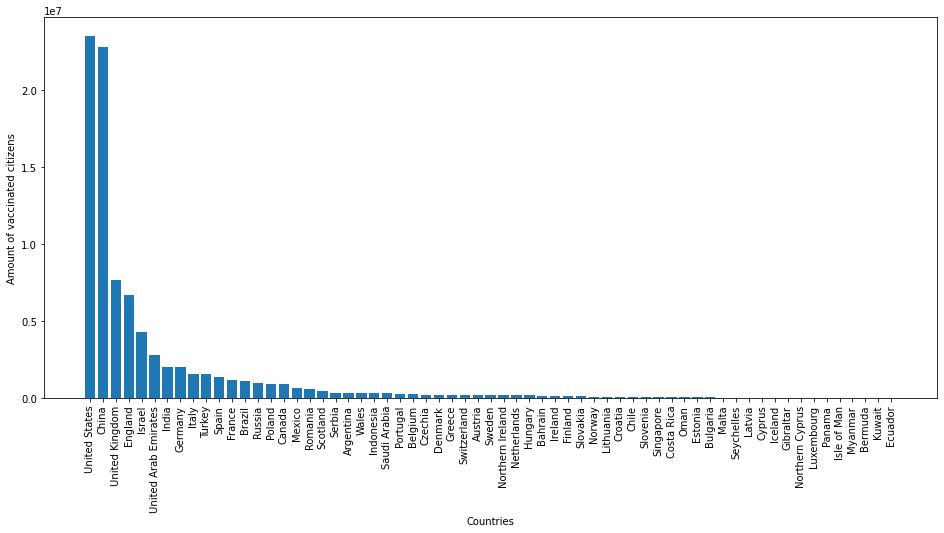

In [30]:
plt.figure(figsize=(16, 7))
plt.bar(vacc_amount.index, vacc_amount.total_vaccinations)
plt.xticks(rotation = 90)
plt.ylabel('Amount of vaccinated citizens')
plt.xlabel('Countries')
plt.show()

<b><br>As can be seen from the plot, China and USA vaccination amounts are much greater then other countrie's. But the leader in vaccination is USA.</b><br><br>

Let's take a look at the same data, but on the map.<br><br>

In [31]:
fig = px.choropleth(locations=vacc_amount.iso_code, color=vacc_amount.total_vaccinations, title='Amount of vaccinated citizens', 
                   color_continuous_scale='rainbow')
fig.show('notebook')

<b><br>As could be seen from this map, many European countries along with some Arabic counties Indonesia, Argentina and Ecuador have the lowest amount of vaccinated citizens.</b><br>

<b><br>At the same time, United Kingdom (mostly England, the biggest part of UK) which is really close to Europe is top 3 vaccinations amount country.</b>

## <br>	<b>&bull;</b> Amount of vaccinated people per hundred<br>

Let's find out which country has the highest level of vaccinated people per hundred.<br><br>

This way we will understand, which country has its biggest part of population vaccinated.<br><br>

In [32]:
vacc_amount = vacc_amount.sort_values('total_vaccinations_per_hundred', ascending=False)

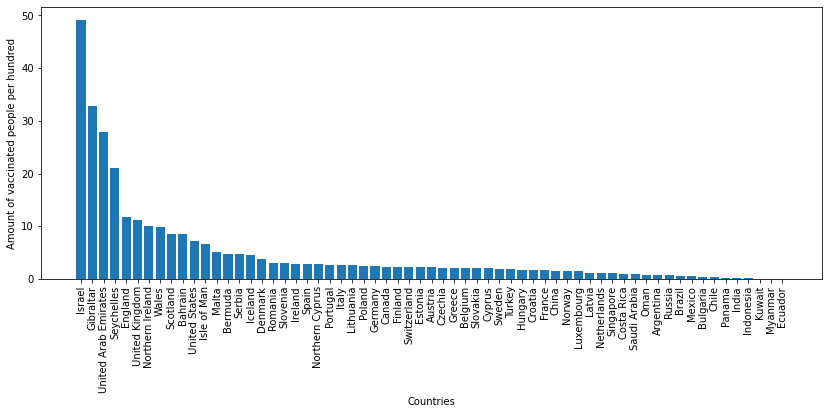

In [33]:
plt.figure(figsize=(14, 5))
plt.bar(vacc_amount.index, vacc_amount.total_vaccinations_per_hundred)
plt.xticks(rotation = 90)
plt.ylabel('Amount of vaccinated people per hundred')
plt.xlabel('Countries')
plt.show()

<br><b>Israel, UAE, Gibraltar have the highest level of vaccinated people per hundred.<br><br>

<b>But we shouldn't forget, that the population of these countries isn't really high, so that might be the reason of such a high statistic indicators.<br><br>

<b>United Kingdom (along with England, Northern Ireland, Scotland and Wales) also have really high results, as it's population is almost 7 times higher than UAE's and Israels, and what is really incredible, <u>2016</u> times higher than Gibraltar's! <br><br>

Now, let's take a look at the same data on map.<br><br>

In [34]:
fig = px.choropleth(locations=vacc_amount.iso_code, color=vacc_amount.total_vaccinations_per_hundred, title='Amount of vaccinated citizens per hundred', 
                   color_continuous_scale='rainbow')
fig.show('notebook')

<br><b>It could now be seen that USA's level of vaccinated per hundred is also high.<br><br>

<b>And the lowest level have Russia, Mexico, Southern America and Asian countries.

## <br>	<b>&bull;</b> The most popular vaccine <br>

Now let's find out which vaccine is the most popular.<br><br>

In [35]:
vacc_pop = vacc_amount.groupby('vaccines').sum().sort_values('total_vaccinations', ascending=False)

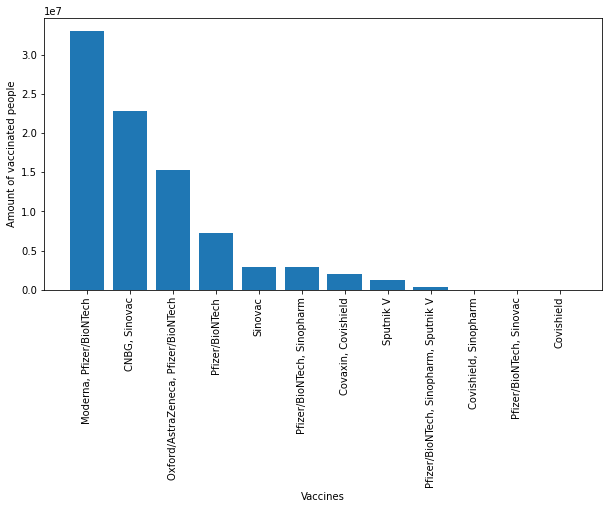

In [36]:
plt.figure(figsize=(10, 5))
plt.bar(vacc_pop.index, vacc_pop.total_vaccinations)
plt.xticks(rotation = 90)
plt.ylabel('Amount of vaccinated people')
plt.xlabel('Vaccines')
plt.show()

<b><br>What is shown on the plot, is the fact that Pfizer/BioNTech vaccine seems to be the most popular and the most wide-spread one.<br><br>

<b>And Covishield along with Covaxin are problaby least popular.<br><br>

Let's also vizualize it on a map.<br><br>

In [37]:
fig = px.choropleth(locations=vacc_amount.iso_code, color=vacc_amount.vaccines, title='Name of the vaccine', 
                   color_continuous_scale='rainbow')
fig.show()

<br><b>It could be easily seen that Pfizer/BioNTech is really the most popular and wide-spread vaccine. People mostly prefer it in Europe and Northern America. <br><br>

<b>The Sputnik V vaccine is used by Russia, Argentina and Serbia.<br><br>

<b>Only Asian countries prefer Covaxin, Covishield.<br><br>

<b>Sinovac is being used in Turkey, Indonesia, Brazil and China.<br><br>

<b>And finally, CNBG is only being used in China.<br><br>

# <b><center>Vaccination amount prediction

## <b>&bull;</b> How the vaccination process changed through the time

In [38]:
t_cols = ['date', 'total_vaccinations']
timeseries_cov = data[t_cols].groupby('date').sum()[4:]

def invboxcox(y, l):
    if l == 0:
        return np.exp(y)
    else:
        return np.exp(np.log(l*y+1)/l)

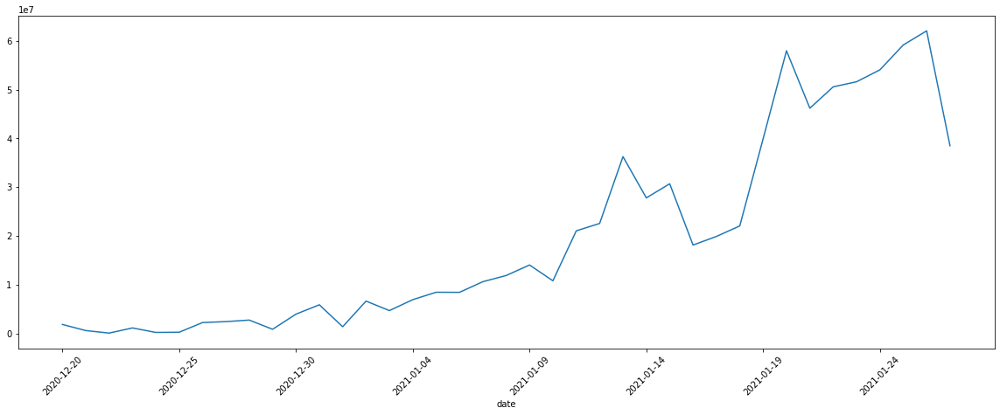

In [39]:
plt.figure(figsize=(20,7))
timeseries_cov.total_vaccinations.plot()
plt.xticks(rotation=45)
plt.show()

<br><b>What can bee seen, is that despite some days the amount of vaccinated people falls, the vaccination has strong long uptrend.<br><br>

## <b>&bull;</b> Timeseries transformations to make it stationary <br>

To be able to predict future values, our timeseries <u><b>must be stationary</b></u>.<br><br>

Let's check if it is true with the help of Dickey-Fuller test.<br><br>

<b>Our hypotethis is, that our timeseries isn't stationary.<br><br>

In [40]:
print('p-value : {}'.format(sm.tsa.stattools.adfuller(timeseries_cov)[1]))

p-value : 0.9989169079096537


<br><br>Our p-value is extremely high and is higher than 0.05.<br><br>

Let's use Box-Cox transformation.<br><br>

In [41]:
timeseries_cov['total_vaccinations_box'], l = scipy.stats.boxcox(timeseries_cov.total_vaccinations)

<br><br>

In [42]:
print('p-value : {}'.format(sm.tsa.stattools.adfuller(timeseries_cov.drop(columns=['total_vaccinations']))[1]))

p-value : 0.7852369713300065


<br>Our p-value is still higher than 0.05.<br>

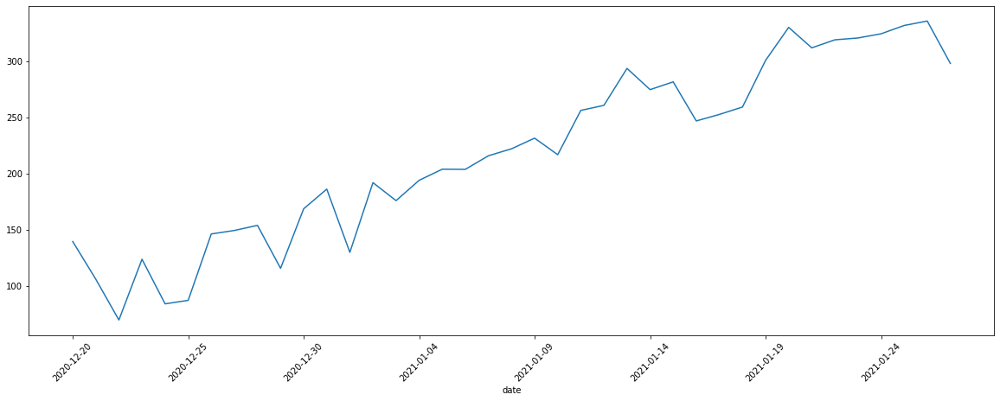

In [43]:
plt.figure(figsize=(20,7))
timeseries_cov.total_vaccinations_box.plot()
plt.xticks(rotation=45)
plt.show()

<br>Our timeseries is kinda seasonable as it reaches it local maximum each 3 days.<br><br>

<br>We will seasonly differentiate our timeseries with the interval of 3 days.<br><br>

In [44]:
timeseries_cov['total_vaccinations_box_diff1int3'] = timeseries_cov.total_vaccinations_box - timeseries_cov.total_vaccinations_box.shift(3)

<br><br>

In [45]:
print('p-value : {}'.format(sm.tsa.stattools.adfuller(timeseries_cov.drop(columns=['total_vaccinations', 'total_vaccinations_box'])[3:])[1]))

p-value : 0.004027273273681377


<br>Well, our p-value is much less than 0.05, which means we could consider our timeseries not to be unstationary.<br><br>

## <b>&bull;</b> ACF and PACF (Autocorrelation function and Partial autocorrelation function) <br>

Now, lets check Autocorrelation and Partial Autocorrelation of our timeseries.<br><br>

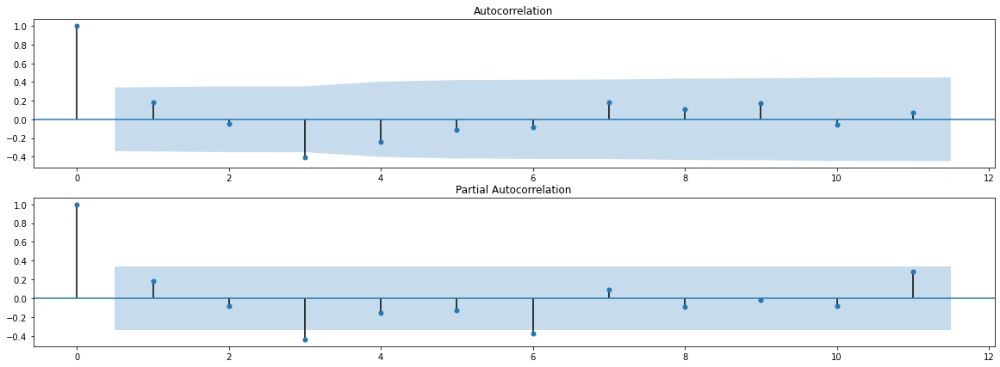

In [46]:
plt.figure(figsize=(20, 7))
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(timeseries_cov.drop(columns=['total_vaccinations', 'total_vaccinations_box'])[6:], 
                         lags=(len(timeseries_cov)-4)/3, ax=ax)
ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(timeseries_cov.drop(columns=['total_vaccinations', 'total_vaccinations_box'])[6:], 
                         lags=(len(timeseries_cov)-4)/3, ax=ax)
plt.show()

<br>Seems like nothing useful can be seen drom here, we will choose our parameters in range of 0-7.<br><br>

As we have done one seasonal and any simple differentiations, D (amount of seasonal diffs) will be 1 and d (amount of simple diffs) will be 0.<br>

In [47]:
d = 0
D = 1

<br>Now we will train many models and will choose the one with the best Akaike Information Criterion (AIC).<br><br>

In [48]:
%%time
results = []
best_aic = float('inf')

parameters = list(product(np.arange(0, 7), np.arange(0, 7), np.arange(0, 7), np.arange(0, 7)))

for param in tqdm(parameters):
    try:
        arima = sm.tsa.statespace.SARIMAX(timeseries_cov.total_vaccinations_box, order=(param[0], d, param[1]), 
                                          seasonal_order=(param[2], D, param[3], 3)).fit(disp=False)
    except:
        continue
    aic = arima.aic
    if aic < best_aic:
        optimal_arima = arima
        best_aic = aic
        best_param = param
    results.append([param, optimal_arima.aic])

100%|██████████| 2401/2401 [03:44<00:00, 10.71it/s]

CPU times: user 5min 18s, sys: 3.36 s, total: 5min 21s
Wall time: 3min 44s


<br>Let's check the optimal model's info. <br><br>

In [49]:
print(optimal_arima.summary())

                                     SARIMAX Results                                     
Dep. Variable:            total_vaccinations_box   No. Observations:                   39
Model:             SARIMAX(1, 0, 1)x(0, 1, 1, 3)   Log Likelihood                -170.684
Date:                           Fri, 29 Jan 2021   AIC                            349.368
Time:                                   15:34:59   BIC                            355.702
Sample:                               12-20-2020   HQIC                           351.579
                                    - 01-27-2021                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0000   2.87e-05   3.49e+04      0.000       1.000       1.000
ma.L1         -0.9434      0.400     -2.357

<br>Now, let's compare our timeseries with ARIMA's.<br><br>

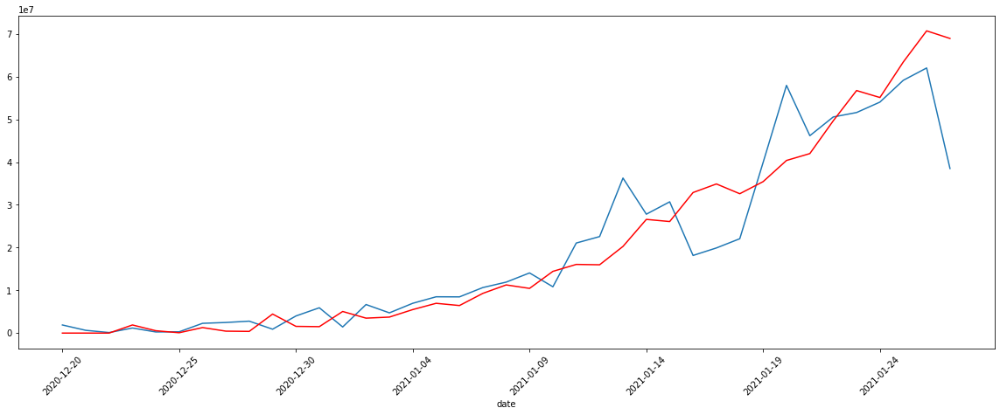

In [50]:
timeseries_cov['arima'] = invboxcox(optimal_arima.fittedvalues, l)
plt.figure(figsize=(20,7))
timeseries_cov.total_vaccinations.plot()
timeseries_cov.arima.plot(color='r')
plt.xticks(rotation=45)
plt.show()

<br>Seems like ARIMA's timeseries is pretty close to ours. Anyway, you can improve it's accuracy with using much higher parameters, which will also take a lot of time.<br><br>

## <b>&bull;</b> Making prediction

<br>Now, let's create predictions for the next week.<br><br>

In [51]:
date = ['2021-01-28', '2021-01-29', '2021-01-30', '2021-01-31', '2021-02-01', '2021-02-02', '2021-02-03', '2021-02-04']
timeseries = timeseries_cov['total_vaccinations']
pred_df = pd.DataFrame(index=date)
pred_df['total_vaccinations'] = predictions = invboxcox(optimal_arima.predict(start=38, end=45).values, l)
timeseries = pd.concat([timeseries, pred_df])

In [52]:
timeseries.drop(columns=[0])[-7:]

,total_vaccinations
2021-01-29,7.478445e+07
2021-01-30,8.311785e+07
2021-01-31,7.945053e+07
2021-02-01,9.314224e+07
2021-02-02,1.029529e+08
2021-02-03,9.864044e+07
2021-02-04,1.147042e+08


<br>And at the end let's vizualize our predictions.<br><br>

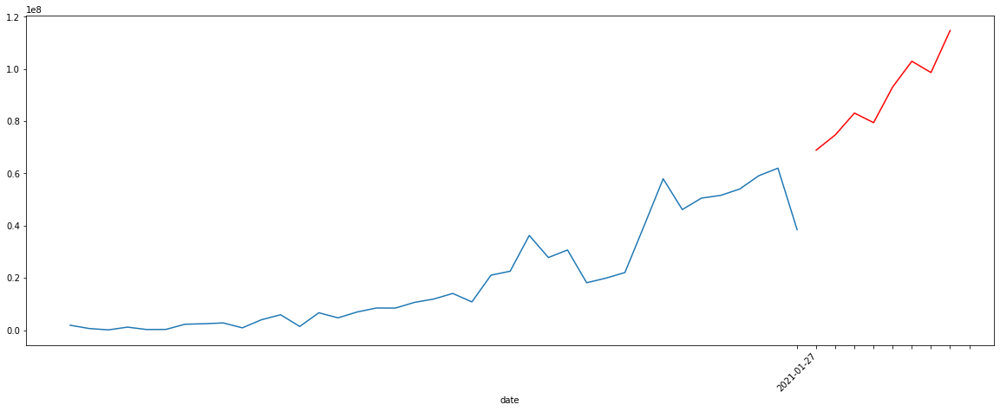

In [53]:
timeseries_cov['arima'] = invboxcox(optimal_arima.fittedvalues, l)
plt.figure(figsize=(20,7))
timeseries.total_vaccinations.plot(color='r')
timeseries_cov.total_vaccinations.plot()
plt.xticks(rotation=45)
plt.show()

# <center><br><b><br> Thank you for reading this notebook!

# <center><b><br>Good luck!